# Motivation

Is the movie industry dying? is Netflix the new entertainment king? Those were the first questions that led to create a dataset focused on movie revenue and analyze it over the last decades. But, why stop there? There are more factors that intervene in this kind of thing, like actors, genres, user ratings and more.


# Questions

In the presentation it is expected you give some recommendations about the type of movies a film production company would have to do if the box takings have to be maximized. As an example, we provide some of the questions that the company could have:

- In which genre I would have to focus?

- How important is to produce a good film (high IMDB rating)to get lots of takings?

- Is it better to produce a film for a general audience or is it better to produce a film targeted to a particular segment?

- Is there an actor/actress that guarantees the success of the film? Or a director?

# 0 Import Packages

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import datetime as dt
from scipy import stats
from sklearn.preprocessing import MinMaxScaler
import plotly.express as px

In [2]:
import warnings

warnings.filterwarnings('ignore')
#%matplotlib inline 
#sns.set(color_codes=True)
pd.set_option('display.max_columns', 100)

# 1 Loading Data

In [3]:
df = pd.read_csv('movies.csv', encoding = "ISO-8859-1")
df.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year
0,8000000.0,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414.0,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986
1,6000000.0,Paramount Pictures,USA,John Hughes,Comedy,70136369.0,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986
2,15000000.0,Paramount Pictures,USA,Tony Scott,Action,179800601.0,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986
3,18500000.0,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248.0,Aliens,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,1986
4,9000000.0,Walt Disney Pictures,USA,Randal Kleiser,Adventure,18564613.0,Flight of the Navigator,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,1986


### Checking for missing values

From the results below, we see there are no missing values in the data

In [4]:
pd.DataFrame({"Missing values (%)":round(df.isnull().sum()/len(df), 2)*100})

,Missing values (%)
budget,0.0
company,0.0
country,0.0
director,0.0
genre,0.0
gross,0.0
name,0.0
rating,0.0
released,0.0
runtime,0.0


### Checking for duplicates

From the results below, it is evident there are no duplicates in the data.

In [5]:
df[df.duplicated()]

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year


In [6]:
#df['budget'] = df['budget'].replace(0.0, 1)
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6820 entries, 0 to 6819
Data columns (total 15 columns):
 #   Column    Non-Null Count  Dtype  
---  ------    --------------  -----  
 0   budget    6820 non-null   float64
 1   company   6820 non-null   object 
 2   country   6820 non-null   object 
 3   director  6820 non-null   object 
 4   genre     6820 non-null   object 
 5   gross     6820 non-null   float64
 6   name      6820 non-null   object 
 7   rating    6820 non-null   object 
 8   released  6820 non-null   object 
 9   runtime   6820 non-null   int64  
 10  score     6820 non-null   float64
 11  star      6820 non-null   object 
 12  votes     6820 non-null   int64  
 13  writer    6820 non-null   object 
 14  year      6820 non-null   int64  
dtypes: float64(3), int64(3), object(9)
memory usage: 799.3+ KB


# 2. Descriptive Statistics

**Adjusting Revenue and Budget to 2016 dollar equivalent then calculating gross profit**

In [7]:
b_2016 = round(df[(df['year'] == 2016)]['budget'].median())
r_2016 = round(df[(df['year'] == 2016)]['gross'].median())

df['ad_revenue'] = round((df['gross']/r_2016 )*10000000)

df['ad_budget'] = round((df['budget']/b_2016)*10000000)

In [8]:
df['gross_profit'] = round(df['ad_revenue']- df['ad_budget'])

In [9]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
budget,6820.0,2.458113e+07,3.702254e+07,0.0,0.00,11000000.0,32000000.00,300000000.0
gross,6820.0,3.349783e+07,5.819760e+07,70.0,1515839.00,12135679.0,40065340.50,936662225.0
runtime,6820.0,1.065513e+02,1.802818e+01,50.0,95.00,102.0,115.00,366.0
score,6820.0,6.374897e+00,1.003142e+00,1.5,5.80,6.4,7.10,9.3
votes,6820.0,7.121952e+04,1.305176e+05,27.0,7665.25,25892.5,75812.25,1861666.0
year,6820.0,2.001000e+03,8.944501e+00,1986.0,1993.00,2001.0,2009.00,2016.0
ad_revenue,6820.0,1.912966e+07,3.323501e+07,40.0,865652.75,6930344.0,22880185.00,534901351.0
ad_budget,6820.0,1.229056e+07,1.851127e+07,0.0,0.00,5500000.0,16000000.00,150000000.0
gross_profit,6820.0,6.839100e+06,2.389385e+07,-83267160.0,-1812706.25,792384.5,9494912.00,412401351.0


### 2.1 Has the Number of Movies Released Increased Over Time?

In [10]:
yr_cnt = df.groupby('year').apply(lambda x:x['name'].count()).reset_index(name='Count')

fig = px.bar(yr_cnt, y='Count', x='year', text='Count',title='Number of Movies')
fig.show()

### 2.2 How has Movie Genres growed over time?

The number of comedy movies being produced has been declining over time and in general the rate of movies in each genre has been steady.

In [11]:
yr_cnt = df.groupby(['year', 'genre']).apply(lambda x:x['name'].count()).reset_index(name='Count')
fig = px.area(yr_cnt, x="year", y="Count",color="genre",title='Number of Movie Genres by the Years')
fig.show()

In [12]:
pd.DataFrame({'Number of movies in the data':df['genre'].value_counts()})

,Number of movies in the data
Comedy,2080
Drama,1444
Action,1331
Crime,522
Adventure,392
Biography,359
Animation,277
Horror,277
Mystery,38
Fantasy,32


### 2.3 How has the Average Runtime varied over the years?

>We see that the average movie runtime has increased over the years and we observe a linear trend. However we expect this trend to plateau (or level off) after 2015 and the average runtime of a movie to be approximately the same. 

In [13]:
movie_length = df.groupby('year').apply(lambda x: np.average(x['runtime'])).reset_index(name='avg_runtime')

fig=px.scatter(movie_length, x = 'year', y ='avg_runtime', trendline='ols', trendline_color_override='darkblue',
           title='Variation of Average Movie Runtime over the Years')
fig.show()

### 2.4 Genre of Movies Produced

In [14]:
gen = pd.DataFrame(df['genre'].value_counts().reset_index())
gen.columns = ['genre', 'count']

fig = px.bar(gen, x='genre', y='count', title = 'Genre of Movies Available')
fig.show()

### 2.5 Movie Score Ratings

Text(0.5, 0, 'Movie Score')

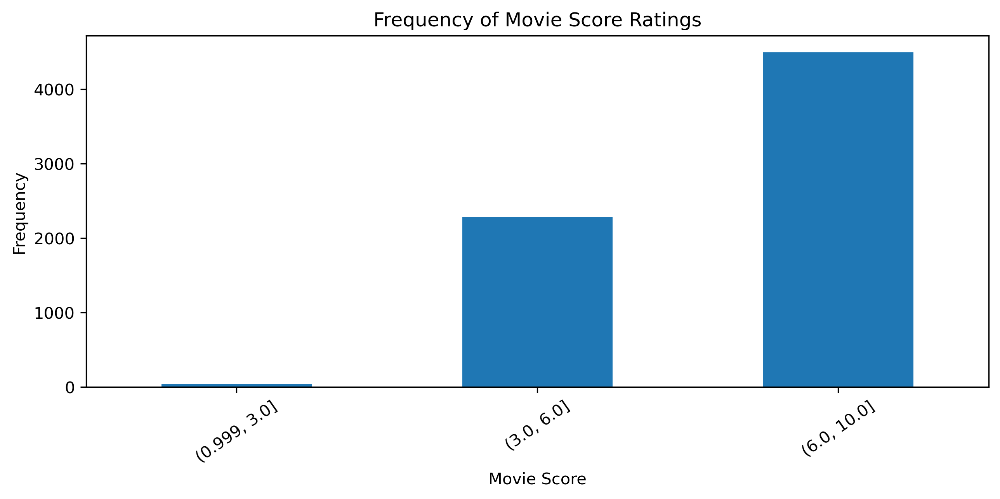

In [15]:
bins = [1, 3, 6, 10]
plt.figure(dpi=300)
df['score'].value_counts(bins=bins)\
                        .sort_index()\
                        .plot(kind    = 'bar',
                              rot     = 35,
                              figsize = (10,4),
                              title   = 'Frequency of Movie Score Ratings')
plt.ylabel('Frequency')
plt.xlabel('Movie Score')

In [16]:
fig = px.histogram(df, x="score")
fig.show()

# 3 General Questions

## 3.1 Does Popularity translates to More Money?

The tree map below depicts the total votes and gross revenues of companies according to their country of origin.
In the whole world, USA has the most successful movie industry, this is evident in the number of companies, gross revenues and popularity (movies with most votes).

Interestingly, we see that the companies with the most popular movies does not necessarily generate more revenue. This fact is presented in the case of **Lucas Film** whose movies gathered only 2.7 million votes from users however they generated over **540 million dollars** in revenue. Same argument can be lended to Marver Studios with only 3.7 million votes but over **420 million dollars** in revenue.

>In fact Lucia Films generated about **4 times** the revenue of companies with the most popular movies such as Warner Bros, Universal Pictures and Paramount pictures which lends credence to to ther argument popularity does not mean more revenue.

In [17]:
fig = px.treemap(df, path=[px.Constant('World'),'country', 'company'], values='votes',
                  color='ad_revenue')
fig.show()

In [18]:
popul = df.groupby(['country', 'company'])['votes','gross_profit'].median().reset_index()
popul = popul.rename(columns={'votes': 'median_votes/film', 'gross_profit': 'median_profit/film'})

In [19]:
fig = px.treemap(popul, path=[px.Constant('World'),'country', 'company'], values='median_votes/film',
                  color='median_profit/film')
fig.show()

## 3.2 Does a bigger film production budget result in more revenue?

#### Note
1. All dollar values have been adjusted to 2016 dollars. [Read More about CPI calculation](http://www.crawfordsworld.com/rob/HEGArchive/Economics/MankiwChapterNotes/HEGMankiw06Notes.htm)


2. Due to outliers and movies with no known budget, We focus the analysis only on big-budget films with at least \\$1M in both budget and gross revenue. 





#### Observation

There’s a  positive weak association between film production budget and gross revenue (R^2 = 0.44), it’s fairly clear that just pouring money into a film’s production budget to hire high-profile actors doesn’t mean that the film will sell more tickets. In fact, if we compare the linear regression (blue line) to the line of parity (black line), the more that’s spent on film production, the less likely the film will end up making that investment back in ticket sales.


Regardless, it’s interesting to see that there’s even a weak correlation between a film’s budget and it’s performance in the box office.

> 36 films with more than \\$100M budget made less than \\$50M in ticket sales (that means they could not even recoup half of the more spent on making the film). Whereas 12 films with a budget less than \\$10M made more than \\$100M in ticket sales. 

It seems that the film industry is like the stock market: You have to spend money to make money. And if you want to make the real big money, it still remains a gamble.

In [20]:
df_budget = df.copy()
df_budget = df_budget[(df_budget['budget'] >= 1000000) & (df_budget['gross'] >= 1000000)]

In [21]:
fig = px.scatter(
    df_budget, x='ad_budget', y='ad_revenue', hover_data = ['genre','score', 'rating','year'],
    hover_name='name',
    marginal_x='histogram', marginal_y='histogram', trendline='ols',
    labels = {'ad_revenue': 'Gross Revenue',
             'ad_budget': 'Movie Production Budget'}, opacity= 0.6, trendline_color_override='darkblue',
    render_mode="svg"
)

fig.add_annotation( # add a text callout with arrow
      text="Regression line R2 = 44%", x=150000000, y=200000000)

fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0 = df_budget['ad_budget'].min(), y0 = df_budget['ad_revenue'].min(),
    x1 = df_budget['ad_budget'].max(), y1 = df_budget['ad_revenue'].max(),
)
fig.add_annotation( # add a text callout with arrow
      text="Parity line", x=100000000, y=350000000)
fig.show()

In [22]:
geq = df_budget[(df_budget['budget'] >= 100000000) & (df_budget['gross'] <= 50000000)]
leq = df_budget[(df_budget['budget'] <= 10000000) & (df_budget['gross'] >= 100000000)]

print(len(geq),"movie(s) with Budget >=$100M and Revenue <= $50M")
print(len(leq),"movie(s) with Budget <=$10M and Revenue >= $100M")

36 movie(s) with Budget >=$100M and Revenue <= $50M
12 movie(s) with Budget <=$10M and Revenue >= $100M


In [23]:
df_budget.head()

,budget,company,country,director,genre,gross,name,rating,released,runtime,score,star,votes,writer,year,ad_revenue,ad_budget,gross_profit
0,8000000.0,Columbia Pictures Corporation,USA,Rob Reiner,Adventure,52287414.0,Stand by Me,R,1986-08-22,89,8.1,Wil Wheaton,299174,Stephen King,1986,29859866.0,4000000.0,25859866.0
1,6000000.0,Paramount Pictures,USA,John Hughes,Comedy,70136369.0,Ferris Bueller's Day Off,PG-13,1986-06-11,103,7.8,Matthew Broderick,264740,John Hughes,1986,40052900.0,3000000.0,37052900.0
2,15000000.0,Paramount Pictures,USA,Tony Scott,Action,179800601.0,Top Gun,PG,1986-05-16,110,6.9,Tom Cruise,236909,Jim Cash,1986,102679047.0,7500000.0,95179047.0
3,18500000.0,Twentieth Century Fox Film Corporation,USA,James Cameron,Action,85160248.0,Aliens,R,1986-07-18,137,8.4,Sigourney Weaver,540152,James Cameron,1986,48632613.0,9250000.0,39382613.0
4,9000000.0,Walt Disney Pictures,USA,Randal Kleiser,Adventure,18564613.0,Flight of the Navigator,PG,1986-08-01,90,6.9,Joey Cramer,36636,Mark H. Baker,1986,10601726.0,4500000.0,6101726.0


# 4 Business Questions and Recommendations

## 4.1 Which genre should the company focus on?

**Recommendations about the genre a film production company would have to do if the box takings have to be maximized.**

To recommend a genre the company focus on, we use unsupervised learning method (clustering) to group movie genres into 4 segments namely: Best, Next-Best, Mid-value and Low-value genres based on the median votes, gross profit and IMDB rating of a movie genre. The reason we used the median instead of total sum or average is because we have an imbalanced data and there are some genres that contain only 1 movie whereas others contain over 100 movies and we know from prior knowledge that the median is insensitive to outliers.

We observed that there only animation movies falls into the best genre category while 2 genres (Adventure and Mystery) fall into the Nex-Best Genre. 


**Recommendation**
>The film production company should focus on producing animation movies as they have the best return on investment (ROI) where ROI is based on gross grofit, votes and IMDB rating.

In [24]:
from sklearn.cluster import KMeans

In [25]:
df_genre = df[['genre', 'votes', 'gross_profit','score']]

### Selection of clusters for Votes 

#### Function to reorder clusters

In [26]:
def order_cluster(cluster_field_name, target_field_name,df,ascending):
    new_cluster_field_name = 'new_' + cluster_field_name
    df_new = df.groupby(cluster_field_name)[target_field_name].mean().reset_index()
    df_new = df_new.sort_values(by=target_field_name,ascending=ascending).reset_index(drop=True)
    df_new['index'] = df_new.index
    df_final = pd.merge(df,df_new[[cluster_field_name,'index']], on=cluster_field_name)
    df_final = df_final.drop([cluster_field_name],axis=1)
    df_final = df_final.rename(columns={"index":cluster_field_name})
    return df_final

In [27]:
tx_votes = df_genre.groupby('genre').votes.median().reset_index(name='median_votes')
df_genre = pd.merge(df_genre, tx_votes, on='genre')
df_genre.head()

,genre,votes,gross_profit,score,median_votes
0,Adventure,299174,25859866.0,8.1,39098.5
1,Adventure,36636,6101726.0,6.9,39098.5
2,Adventure,102879,-5230304.0,7.4,39098.5
3,Adventure,79465,95329118.0,6.5,39098.5
4,Adventure,66366,50154072.0,7.3,39098.5


In [28]:
sse={}
tx_votes = df_genre[['median_votes']]

for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_votes)
    tx_votes["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_

Text(0.5, 0, 'Number of clusters for Votes')

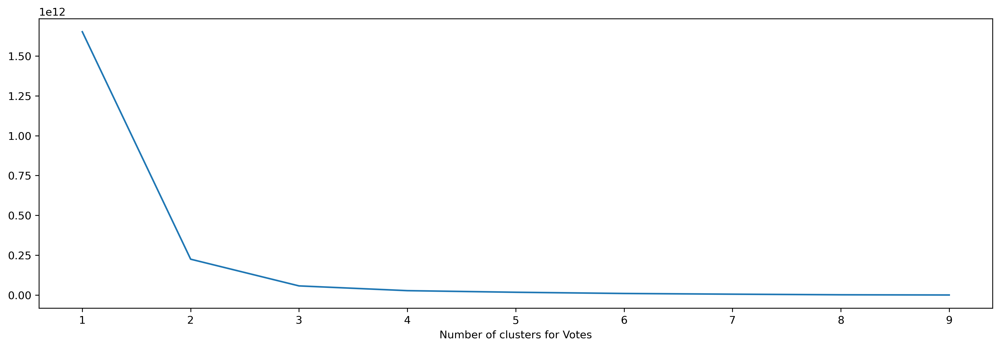

In [29]:
plt.figure(figsize=(16,5), dpi=300)
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of clusters for Votes")

In [30]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(df_genre[['median_votes']])
df_genre['VotesCluster'] = kmeans.predict(df_genre[['median_votes']])

In [31]:
df_genre = order_cluster('VotesCluster', 'median_votes',df_genre,True)

In [32]:
df_genre.groupby('VotesCluster')['median_votes'].describe()

,count,mean,std,min,25%,50%,75%,max
VotesCluster,,,,,,,,
0,4782.0,20302.194270,5337.270454,3361.5,16435.5,18529.5,18529.5,32498.0
1,2038.0,51910.607458,6597.387883,39098.5,52633.0,55046.0,55046.0,68990.5


### Selection of Clusters for Gross Profit

In [33]:
tx_profit = df_genre.groupby('genre').gross_profit.median().reset_index(name='median_profit')
df_genre = pd.merge(df_genre, tx_profit, on='genre')
df_genre.head()

,genre,votes,gross_profit,score,median_votes,VotesCluster,median_profit
0,Adventure,299174,25859866.0,8.1,39098.5,1,2107345.0
1,Adventure,36636,6101726.0,6.9,39098.5,1,2107345.0
2,Adventure,102879,-5230304.0,7.4,39098.5,1,2107345.0
3,Adventure,79465,95329118.0,6.5,39098.5,1,2107345.0
4,Adventure,66366,50154072.0,7.3,39098.5,1,2107345.0


In [34]:
sse={}
tx_profit = df_genre[['median_profit']]

for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_profit)
    tx_profit["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_

Text(0.5, 0, 'Number of clusters for Gross Profit')

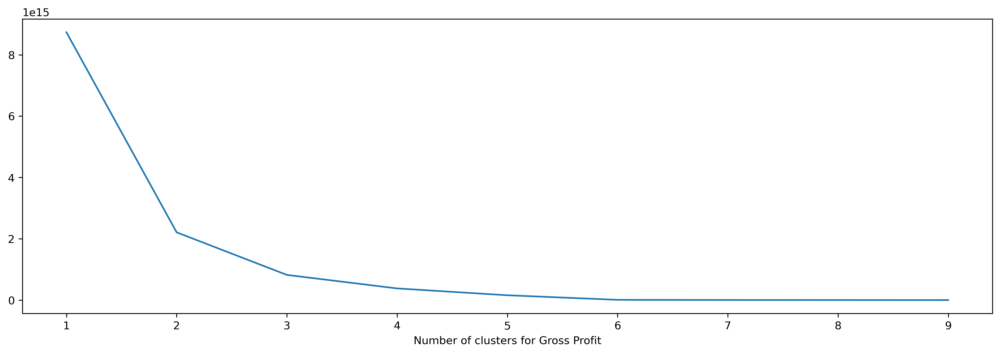

In [35]:
plt.figure(figsize=(16,5), dpi=300)
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of clusters for Gross Profit")

In [36]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(df_genre[['median_profit']])
df_genre['ProfitCluster'] = kmeans.predict(df_genre[['median_profit']])

In [37]:
df_genre = order_cluster('ProfitCluster', 'median_profit', df_genre, True)

In [38]:
df_genre.groupby('ProfitCluster')['median_profit'].describe()

,count,mean,std,min,25%,50%,75%,max
ProfitCluster,,,,,,,,
0,6266.0,8.479435e+05,531399.421287,32054.0,290674.0,648751.0,1295146.0,2287866.0
1,554.0,4.428253e+06,892414.792302,3536644.0,3536644.0,4428253.0,5319862.0,5319862.0


### Selection of Clusters for IMDB ratings

In [39]:
tx_score = df_genre.groupby('genre').score.median().reset_index(name='median_score')
df_genre = pd.merge(df_genre, tx_score, on='genre')
df_genre.head()

,genre,votes,gross_profit,score,median_votes,VotesCluster,median_profit,ProfitCluster,median_score
0,Adventure,299174,25859866.0,8.1,39098.5,1,2107345.0,0,6.5
1,Adventure,36636,6101726.0,6.9,39098.5,1,2107345.0,0,6.5
2,Adventure,102879,-5230304.0,7.4,39098.5,1,2107345.0,0,6.5
3,Adventure,79465,95329118.0,6.5,39098.5,1,2107345.0,0,6.5
4,Adventure,66366,50154072.0,7.3,39098.5,1,2107345.0,0,6.5


In [40]:
sse={}
tx_score = df_genre[['median_score']]

for k in range(1, 10):
    kmeans = KMeans(n_clusters=k, max_iter=1000).fit(tx_score)
    tx_score["clusters"] = kmeans.labels_
    sse[k] = kmeans.inertia_

Text(0.5, 0, 'Number of clusters for IMDB Ratings')

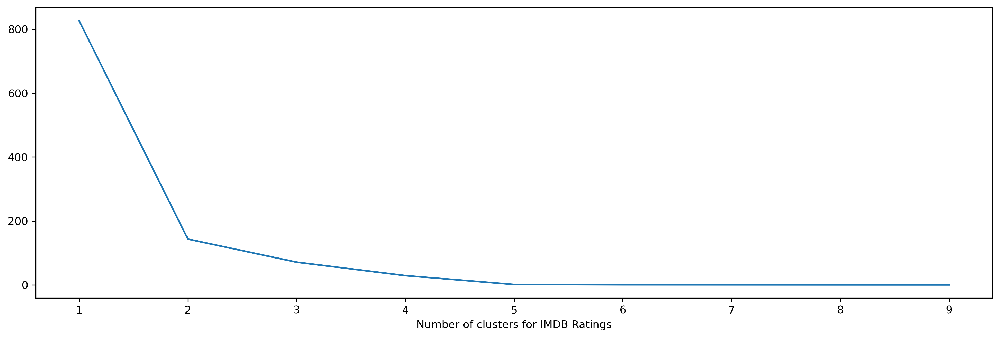

In [41]:
plt.figure(figsize=(16,5), dpi=300)
plt.plot(list(sse.keys()), list(sse.values()))
plt.xlabel("Number of clusters for IMDB Ratings")

In [42]:
kmeans = KMeans(n_clusters=2)
kmeans.fit(df_genre[['median_score']])
df_genre['ScoreCluster'] = kmeans.predict(df_genre[['median_score']])

In [43]:
df_genre = order_cluster('ScoreCluster', 'median_score', df_genre, True)

In [44]:
df_genre.groupby('ScoreCluster')['median_score'].describe()

,count,mean,std,min,25%,50%,75%,max
ScoreCluster,,,,,,,,
0,3784.0,6.156501,0.139160,5.7,6.2,6.2,6.2,6.4
1,3036.0,6.793347,0.151859,6.5,6.8,6.8,6.8,7.1


### Overall Segmentation Classification

In [45]:
df_genre['OverallScore'] = (df_genre['VotesCluster']) + df_genre['ProfitCluster'] + (df_genre['ScoreCluster'])

In [46]:
round(df_genre.groupby('OverallScore')['median_votes','median_profit', 'median_score' ].mean(),1)

,median_votes,median_profit,median_score
OverallScore,,,
0,18250.4,1267848.4,6.2
1,33182.2,677128.2,6.5
2,41740.1,2019006.2,6.5
3,52633.0,5319862.0,6.8


The scoring above clearly shows us that genre with Overallscore 3 are the best genres whereas 0 is the worst.

To keep things simple, better we name these scores:

0: Low Value

1: Mid Value

2: Next-Best

3: Best overall score before segmentation

In [47]:
def clasify(col):
    if col == 0:
        return 'Low-Value'
    elif col == 1:
        return 'Mid-Value'
    elif col == 2:
        return 'Next-Best'
    else:
        return 'Best'

In [48]:
df_genre['Segment'] = df_genre.apply(lambda x: clasify(x['OverallScore']), axis=1)

The average votes, gross profit and score rating of each segment

In [49]:
round(df_genre.groupby(['OverallScore', 'Segment'])['votes','gross_profit', 'score' ].mean(),1)

,,votes,gross_profit,score
OverallScore,Segment,,,
0,Low-Value,44301.9,7030881.6,6.2
1,Mid-Value,79102.1,5303780.9,6.5
2,Next-Best,110440.4,11394206.8,6.4
3,Best,109754.0,20082912.5,6.7


In [50]:
"""
df2 = df.copy()
df_g = df_genre[['Segment', 'genre']]

df2 = pd.merge(df2, df_g, on='genre', how='inner')
df2 = df2.drop_duplicates()
"""


"\ndf2 = df.copy()\ndf_g = df_genre[['Segment', 'genre']]\n\ndf2 = pd.merge(df2, df_g, on='genre', how='inner')\ndf2 = df2.drop_duplicates()\n"

In [51]:
df_genre.groupby(['Segment'])['genre'].nunique().reset_index(name = 'Number of genre in the classification')

,Segment,Number of genre in the classification
0,Best,1
1,Low-Value,8
2,Mid-Value,6
3,Next-Best,2


In [52]:
fig = px.scatter(df_genre, 
                 x="gross_profit", y="votes", color="Segment",hover_name='genre',
                 hover_data=['genre'], trendline="ols", template="simple_white",render_mode='svg',
                title="Genre Segmentation")
fig.show()

**Best Genre**

In [53]:
df_high = df_genre[df_genre['Segment']=='Best']
df_high['genre'].value_counts()

Animation    277
Name: genre, dtype: int64

**Next Best Genre**

In [54]:
df_next = df_genre[df_genre['Segment']=='Next-Best']
df_next['genre'].value_counts()

Adventure    392
Mystery       38
Name: genre, dtype: int64

In [55]:
fig = px.scatter(df_high, x= 'gross_profit', y='votes', hover_name='genre',
                 hover_data=['genre'])
fig.show()


## 4.2 How important is to produce a good film (high IMDB rating) to get lots of takings?

We observe that in general, there is a weak positive association between producing a good film and generating high gross profit (correlation = 0.2). In addition there's a weak positive association (correlation = 0.39) between producing a good film and the movie being popular (high votes). In other words, producing a good film does not translate to it being popular hence film makers should prioritise other factors such as aggressive marketing using advertisement channels such as social media, etc.

<AxesSubplot:>

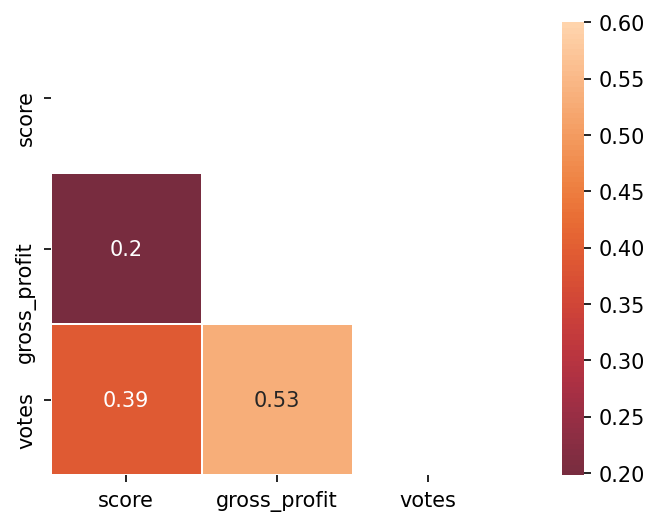

In [56]:
corr = df[['score', 'gross_profit', 'votes']].corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(figsize=(10,4),dpi=150)
sns.heatmap(corr, mask=mask, vmax=.6, center=0, square=True, linewidths=.5,annot=True)


In [57]:

fig = px.scatter(df, x = 'score', y = 'votes', trendline='ols', hover_name='name', 
                 hover_data=['rating', 'year','gross_profit'],template="simple_white",
                 render_mode='svg', title = 'All Genre: IMDB score and Votes',
                 labels={'score': 'IMDB Ratings', 'votes':'Number of user votes'}
                 )
fig.show()

## How about if we focus on animation movies (our best genre), is the conclusion above true?

We see from the correlation plot below that the conclusion above is not wholely true. Though there's remains a weak positive association between producing a good film and generating high gross profit. However, there exists **a moderate positive association (0.54)** between producing a good animation film and the film being popular (high votes).

>In summary, **if a film company focuses on producing a good animation movie, there's a moderate chance of it being popular by having lots of votes**. In fact, when we fit a simple linear regression model, we discover that votes alone explains 29% of the variation in IMDB ratings.

<AxesSubplot:>

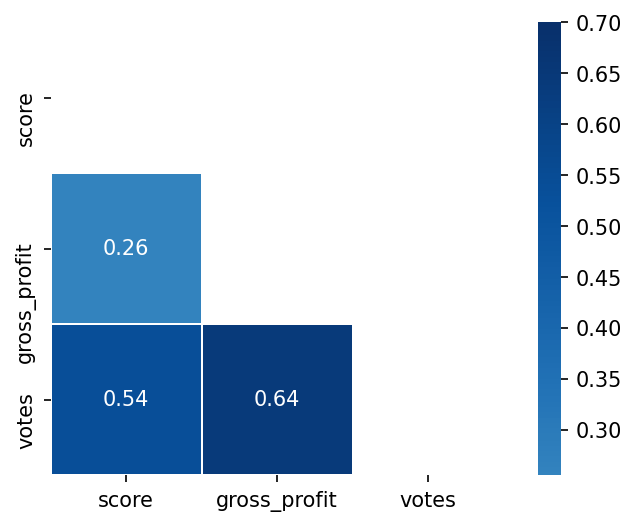

In [58]:
corr = df_high[['score', 'gross_profit', 'votes']].corr()
# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))
plt.figure(dpi=150)
sns.heatmap(corr, mask=mask,cmap='Blues', vmax=.7, center=0, square=True, linewidths=.5,annot=True)

In [59]:
df_anim = df[df['genre'] == 'Animation']
fig = px.scatter(df_anim, x = 'score', y = 'votes', trendline='ols', hover_name='name', 
                 hover_data=['rating', 'year','gross_profit'],
                 render_mode='svg', title = 'Animation Movies: IMDB score and Votes',
                 labels={'score': 'IMDB Ratings', 'votes':'Number of user votes'}
                 )
fig.show()


## 4.3 Is it better to produce a film for a general audience or a film targeted to a particular segment?

Generally, the decision to produce a film for a general audience or a targeted segment depends on the business aim of the company. If its aim is to produce a popular movie irrespective of the genre then it should produce a PG-13 film as the median vote for movies in this category is 34,000.
However if its aim is to maximise as much profit as possible, then it should produce a film for a general audience as the median gross profit for such movies is \\$7M.

**Note** that i excluded movie ratings with 1 film and unspecified ratings from this analysis

### What if the film company decides to go with our recommendation of producing an animation film?

If the film company decides to produce an animation filma and its objective is to maximise profit and a decent movie popularity then it's better to **produce a PG film** instead of a general film as such movies have a median gross profit of \\$8.7M and a popularity of 71.7 thousand votes.

> In fact, if the film company follows our recommendation of **producing a PG animation film** then it should be rest assured of getting 2 times more votes and a comparably high profit when compared to producing a PG13 or General audience film irrespective of the genre.



In [60]:
df['rating'].value_counts()

R                3392
PG-13            1995
PG                951
NOT RATED         174
G                 147
UNRATED            71
Not specified      63
NC-17              22
B                   1
B15                 1
TV-14               1
TV-PG               1
TV-MA               1
Name: rating, dtype: int64

In [61]:
aud_to_drop = ['NOT RATED', 'UNRATED', 'Not specified', 'B', 'TV-MA', 'TV-PG', 'B15', 'TV-14']
df_aud = df.copy()

df_aud = df_aud[~df_aud['rating'].isin(aud_to_drop)]

**Median gross profit, votes and score of movie rating segment**

In [62]:
gen_aud = df_aud.groupby('rating')['gross_profit', 'votes', 'score'].median().reset_index()
gen_aud

,rating,gross_profit,votes,score
0,G,7120406.0,18972.0,6.60
1,NC-17,325391.0,24280.0,6.75
2,PG,4225931.0,21695.0,6.30
3,PG-13,2491612.0,39409.0,6.30
4,R,395702.0,23505.5,6.50


In [63]:
fig = px.bar(gen_aud, x='gross_profit', y='votes', color='rating',hover_name='rating',
                 title='Median Statistics of Movie Rating Segement')
                 
fig.show()

#### If the film company decide to go with our recommendation of producing an animation film

In [64]:
df_anim['rating'].value_counts()

PG               152
G                 89
PG-13             18
R                 13
NOT RATED          3
Not specified      2
Name: rating, dtype: int64

In [65]:
df_anim_rating = df_anim[~df_anim['rating'].isin(aud_to_drop)]
df_anim_rating = df_anim_rating.groupby('rating')['gross_profit', 'votes', 'score'].median().reset_index()
df_anim_rating

,rating,gross_profit,votes,score
0,G,9333058.0,32118,6.80
1,PG,8779499.0,71770,6.75
2,PG-13,50667.5,37920,6.90
3,R,405796.0,48937,7.70


In [66]:
fig = px.bar(df_anim_rating, x='gross_profit', y='votes', color='rating',hover_name='rating',
                 title='Median Statistics of Animation Movies Rating Segement')
                 
fig.show()

## 4.4 Does Higher Budget translate to more Revenue for Animation Movies?

Recall that there were 36 movies that had a production budget of over \\$100M and the producers could not even make half of the production budget (\\$50M) in revenue. Also, there were 12 movies that had a production budget of less than \\$10M but made 10 times the budget as revenue (over \\$100M) which infers that **in general higher budget does not translate to higher revenue**.

> There are only 2 animation films with a budget of over \\$100M that generated revenue less than \\$50M. This means that if the company follows our recommendation of producing an animation film, then it should be rest assured that if it invests over \\$100M in producing a film, the chances of the film generating a revenue of more than \\$50M is **roughly 90% higher** compared to not following our recommendation.

In [67]:
fig = px.scatter(
    df_anim, x='ad_budget', y='ad_revenue', hover_data = ['genre','score', 'rating','year'],
    hover_name='name',
    marginal_x='histogram', marginal_y='histogram', trendline='ols',
    labels = {'ad_revenue': 'Gross Revenue',
             'ad_budget': 'Movie Production Budget'}, opacity= 0.6, trendline_color_override='darkblue',
    render_mode="svg"
)

fig.add_annotation( # add a text callout with arrow
      text="Regression line R2 = 46.8%", x=130000000, y=184000000)

fig.add_shape(
    type="line", line=dict(dash='dash'),
    x0 = df_budget['ad_budget'].min(), y0 = df_budget['ad_revenue'].min(),
    x1 = df_budget['ad_budget'].max(), y1 = df_budget['ad_revenue'].max(),
)
fig.add_annotation( # add a text callout with arrow
      text="Parity line", x=100000000, y=350000000)
fig.show()

In [68]:
geq = df_anim[(df_anim['budget'] >= 100000000) & (df_anim['gross'] <= 50000000)]
leq = df_anim[(df_anim['budget'] <= 10000000) & (df_anim['gross'] >= 100000000)]

print(len(geq),"movie(s) with Budget >=$100M and Revenue <= $50M")
print(len(leq),"movie(s) with Budget <=$10M and Revenue >= $100M")

2 movie(s) with Budget >=$100M and Revenue <= $50M
0 movie(s) with Budget <=$10M and Revenue >= $100M


## 4.5 Is there a director that guarantees the success of the film?

For this analysis, we only select directors that have produced 3 or more movies.
Interestingly, we discovered that the top 5 directors who have produced the most movies are not in the top according to the average votes per movie. This tells us that **quantity does not imply quality**.

George Lucas is the movie director with the highest median gross profit per film (roughly \\$160M) and he has produced 3 films. His films also have a median votes of 570k votes per film which is not too shabby.

### What if the film company decides to go with our recommendation of producing an animation film?

Then Andrew Stanton should be the producer as his animation films have a median votes of about 772k votes and median gross profit of roughly \\$170M per film.

In [69]:
actor_cnt = df.groupby('director').apply(lambda x:x['name'].count()).reset_index(name='Movie Counts')
actor_cnt.sort_values(by='Movie Counts',ascending=False,inplace=True)

actor_cnt=actor_cnt[:5]

fig = px.bar(actor_cnt, x='director', y='Movie Counts',
             labels={'Movie Counts':'Number of films directed', 'director':'Director'},
             color='Movie Counts',title='Top 5 Directors who have produced the most Movies ')
fig.show()

In [70]:
actor_cnt

,director,Movie Counts
2724,Woody Allen,33
459,Clint Eastwood,24
2487,Steven Soderbergh,21
2488,Steven Spielberg,21
2268,Ron Howard,20


In [71]:

top_director = df.pivot_table(index='director', 
                              aggfunc = {'gross_profit': 'median', 'votes':'median', 'name':'count'})

top_director = top_director[top_director['name']>=3]
top_director = top_director.sort_values(by=['gross_profit', 'votes'], ascending=[False, False]).reset_index()[:5]
top_director = top_director.rename(columns= {'votes':'median_votes','gross_profit': 'median_profit','name':'number_of_movies'})

top_director

,director,median_profit,number_of_movies,median_votes
0,George Lucas,160657209.0,3,570398.0
1,Pete Docter,108062988.0,3,652440.0
2,Andrew Stanton,104149678.5,4,498131.5
3,Andrew Adamson,99721593.0,4,326607.5
4,John Lasseter,79388900.0,5,292006.0


In [72]:
fig = px.bar(top_director, x='director', y='median_profit',template="simple_white",
             color='median_profit',hover_name='director', hover_data=['median_votes', 'number_of_movies'],
             title='Top 5 Directors with highest median profit and votes per film',
            labels={'median_profit':'Median profit per film', 'director':'Director'})
fig.show()

#### If the film company decides to go with our recommendation of producing an animation film

In [73]:
top_director_anim = df_anim.pivot_table(index='director', 
                              aggfunc = {'gross_profit': 'median', 'votes':'median', 'name':'count'})

top_director_anim = top_director_anim[top_director_anim['name']>=3]
top_director_anim = top_director_anim.sort_values(by=['gross_profit', 'votes'], ascending=[False, False]).reset_index()[:5]
top_director_anim = top_director_anim.rename(columns= {'votes':'median_votes','gross_profit': 'median_profit','name':'number_of_movies'})

top_director_anim

,director,median_profit,number_of_movies,median_votes
0,Andrew Stanton,170488834.0,3,772029.0
1,Pete Docter,108062988.0,3,652440.0
2,John Lasseter,79388900.0,5,292006.0
3,Carlos Saldanha,52137455.5,4,179863.5
4,Brad Bird,42895284.0,3,516560.0


In [74]:
actor_cnt = df_anim.groupby('director').apply(lambda x:x['name'].count()).reset_index(name='Movie Counts')
actor_cnt.sort_values(by='Movie Counts',ascending=False,inplace=True)

top_dir=actor_cnt[:5]

fig = px.bar(top_dir, x='director', y='Movie Counts', color='Movie Counts',
             labels={'Movie Counts':'Number of films directed', 'director':'Director'},
             title='Top 5 Directors who have produced the most Animation Movies ')
fig.show()

In [75]:
fig = px.bar(top_director_anim, x='director', y='median_profit',template="simple_white",
             color='median_profit',hover_name='director', hover_data=['median_votes', 'number_of_movies'],
             title='Top 5 Animation Directors with highest median profit and votes per film',
            labels={'median_profit':'Median profit per film', 'director':'Director'})
fig.show()